# Week 8 Assignment

## Jessica Melendez & Sam Guerrero

For this week's assignment we will conduct a spatial autocorrelation analysis of arrest data to better understand where there are significant areas of clustering and see what that analysis tells us about arrest data between West LA and South LA. 

First, let's import our libraries for this analysis

In [1]:
# to read and wrangle data
import pandas as pd

# to import data from LA Data portal
from sodapy import Socrata

# to create spatial data
import geopandas as gpd

# for basemaps
import contextily as ctx

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

To get started, we have to bring in a geography that will allow us to get a better sense of the summary of our arrests just like in week 7!

Okay, we have to bring in the tracts

In [2]:
gdf_tracts = gpd.read_file('data/tracts.geojson')

Next, remember to bring in the block groups from census reporter...

In [3]:
gdf = gpd.read_file('data/acs2019_5yr_B01003_15000US060372672002.geojson')

Okay, now let's see if we can get a visualization of the block groups

<AxesSubplot:>

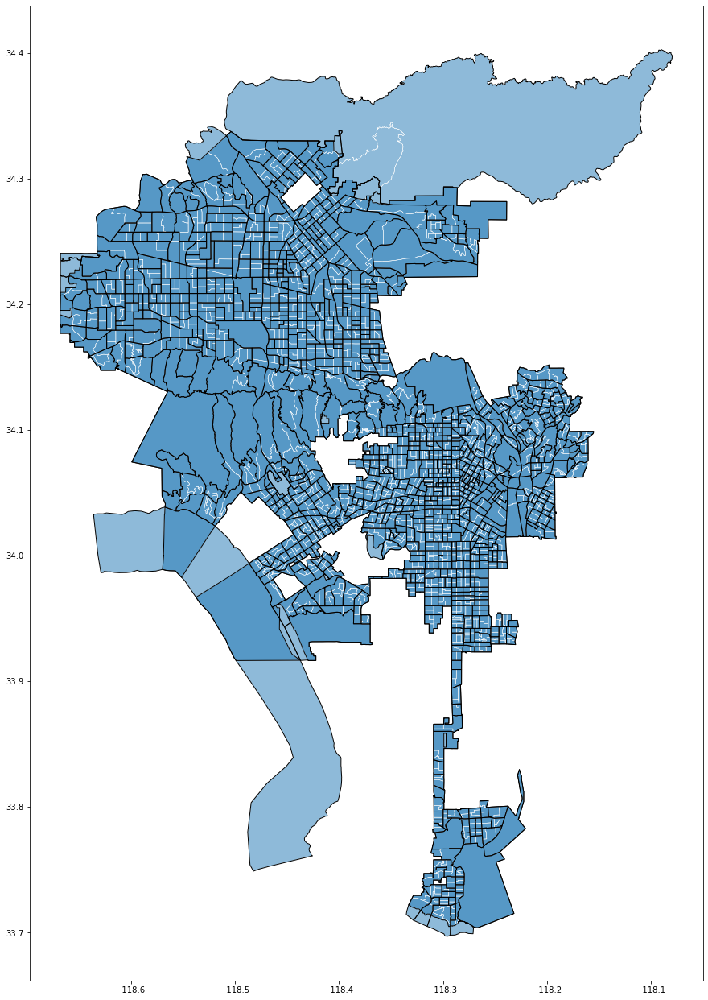

In [4]:
# compare
fig,ax = plt.subplots(figsize=(15,80))

# blue background of census tracts
gdf_tracts.plot(ax=ax,zorder=10,alpha=0.5)
# alpha is transparency

# while lines to show block groups (sandwiched between the two layers above for visual clarity)
gdf.boundary.plot(ax=ax,color='white',zorder=15,lw=0.5)
# drawing not filling in

# black boundary lines of census tracts on top of everything
gdf_tracts.boundary.plot(ax=ax,color='black',zorder=20,lw=1)

Let's zoom in!

In [5]:
minx,miny,maxx,maxy = gdf.total_bounds

(33.996922999999995, 34.102497)

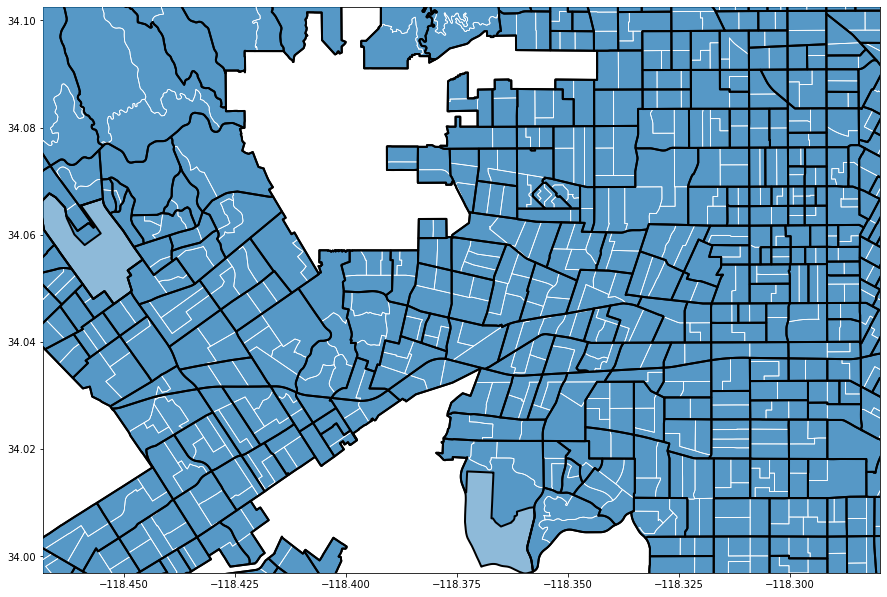

In [6]:
# compare
fig,ax = plt.subplots(figsize=(15,80))

# blue background of census tracts
gdf_tracts.plot(ax=ax,zorder=10,alpha=0.5)

# black boundary of census tracts
gdf_tracts.boundary.plot(ax=ax,color='black',zorder=20,lw=2)

# while lines to show block groups (sandwiched between the two layers above for visual clarity)
gdf.boundary.plot(ax=ax,color='white',zorder=15,lw=0.8)

# zoom in
ax.set_xlim(minx+0.2,maxx-0.2) # zooming in just a bit
ax.set_ylim(miny+0.3,maxy-0.3)

Let's do our due diligence and clean up some data... particularly for the block groups

In [7]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2516 entries, 0 to 2515
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geoid             2516 non-null   object  
 1   name              2516 non-null   object  
 2   B01003001         2516 non-null   float64 
 3   B01003001, Error  2516 non-null   float64 
 4   geometry          2516 non-null   geometry
dtypes: float64(2), geometry(1), object(2)
memory usage: 98.4+ KB


In [8]:
gdf = gdf[['geoid','B01003001','geometry']]

We should rename the columns before moving on...

In [9]:
gdf.columns = ['FIPS','TotalPop','geometry']

In [10]:
gdf.tail()

,FIPS,TotalPop,geometry
2511,15000US060379800261,26.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
2512,15000US060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2513,15000US060379800311,1175.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
2514,15000US060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."
2515,16000US0644000,3966936.0,"MULTIPOLYGON (((-118.66818 34.18987, -118.6681..."


The last row encapsulates the entire population of the City of LA, let's get rid of it so our dataset is not scewed as we conduct our spatial analysis

In [11]:
gdf=gdf.drop(2515)

In [12]:
gdf.tail()

,FIPS,TotalPop,geometry
2510,15000US060379800241,223.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184..."
2511,15000US060379800261,26.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
2512,15000US060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2513,15000US060379800311,1175.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
2514,15000US060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."


Perfect, 2515 has been dropped! Now let's fix the FIPS code...

In [13]:
gdf['FIPS'] = gdf['FIPS'].str.replace('15000US','')
gdf.tail()

,FIPS,TotalPop,geometry
2510,060379800241,223.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184..."
2511,060379800261,26.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
2512,060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2513,060379800311,1175.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
2514,060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."


Now, let's sort by total population and drop block groups with less than 100 total population

In [14]:
gdf.sort_values(by='TotalPop').head(20)

,FIPS,TotalPop,geometry
2514,060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."
2358,060372772002,0.0,"MULTIPOLYGON (((-118.38597 33.94734, -118.3859..."
2512,060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2509,060379800231,0.0,"MULTIPOLYGON (((-118.64870 34.23120, -118.6480..."
2506,060379800201,0.0,"MULTIPOLYGON (((-118.34412 34.21700, -118.3438..."
2508,060379800221,0.0,"MULTIPOLYGON (((-118.50266 34.30809, -118.5026..."
2501,060379800091,5.0,"MULTIPOLYGON (((-118.33707 34.14160, -118.3361..."
2503,060379800141,9.0,"MULTIPOLYGON (((-118.26088 33.76850, -118.2602..."
2511,060379800261,26.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
2507,060379800211,33.0,"MULTIPOLYGON (((-118.40183 34.26509, -118.4017..."


In [15]:
gdf = gdf[gdf['TotalPop']>100]
gdf.head(20)

,FIPS,TotalPop,geometry
0,060371011101,1688.0,"MULTIPOLYGON (((-118.29133 34.26008, -118.2913..."
1,060371011102,1614.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
2,060371011103,981.0,"MULTIPOLYGON (((-118.30080 34.26327, -118.2979..."
3,060371011221,2156.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
4,060371011222,1249.0,"MULTIPOLYGON (((-118.29075 34.26906, -118.2906..."
5,060371012101,3047.0,"MULTIPOLYGON (((-118.29434 34.25233, -118.2931..."
6,060371012102,3300.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
7,060371012201,1126.0,"MULTIPOLYGON (((-118.28592 34.25404, -118.2859..."
8,060371012202,2576.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2846..."
9,060371013001,1283.0,"MULTIPOLYGON (((-118.27817 34.25577, -118.2781..."


Great! Let's plot and map this out using the web mercator

In [16]:
gdf = gdf.to_crs(epsg=3857)

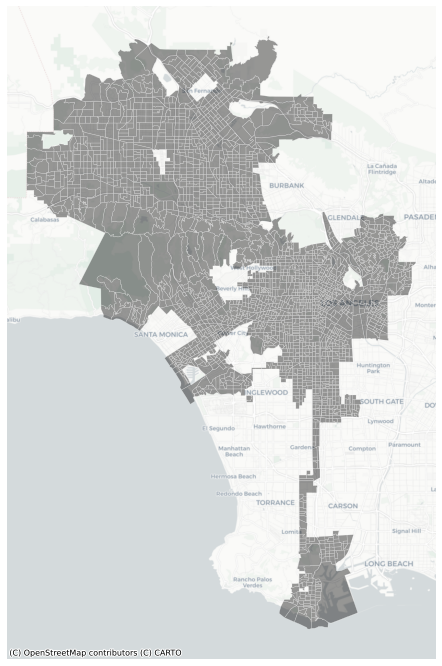

In [17]:
fig, ax = plt.subplots(figsize=(12,12))

gdf.plot(ax=ax,
         color='black', 
         edgecolor='white',
         lw=0.5,
         alpha=0.4)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

Now, let's try getting our data from LA Open Portal Data

In [18]:
client = Socrata("data.lacity.org", None)

results = client.get("amvf-fr72", 
                     limit=50000,
                     where = "arst_date between '2021-04-01T00:00:00' and '2021-10-27T00:00:00'",
                     order='arst_date desc')

# Convert to pandas DataFrame
arrests = pd.DataFrame.from_records(results)

How big is our dataset if we look at data particularly from April 2021 to the most recent data in Ocotber 2021?

In [ ]:
arrests = pd.read_csv('data/arrests.csv')

In [19]:
arrests.shape

(39202, 25)

Alright, alright... 39202 records of arrests made

We have to convert the pandasdataframe into a geodataframe

In [21]:
import pandas as pd
import geopandas
import matplotlib.pyplot as plt

In [22]:
arrests = gpd.GeoDataFrame(arrests, 
                         crs='EPSG:4326',
                         geometry=gpd.points_from_xy(arrests.lon, arrests.lat))

In [23]:
arrests = arrests.to_crs(epsg=3857)

In [ ]:
print(arrests.head())

Remember to turn our lat/long into floats

In [24]:
arrests.lon = arrests.lon.astype('float')
arrests.lat = arrests.lat.astype('float')

Map it out!

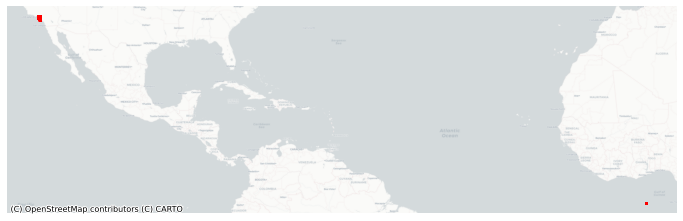

In [25]:
fig,ax = plt.subplots(figsize=(12,12))

arrests.plot(ax=ax,
             color='red',
             markersize=1)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)


In [26]:
arrests[arrests.lon==0]

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,location,lat,lon,location_1,bkg_date,bkg_time,bgk_location,bkg_loc_cd,crsst,geometry
32,6267228,BOOKING,2021-10-23T00:00:00.000,1525,09,Van Nuys,0964,34,M,O,...,5000 TILDEN AV,0.0,0.0,"{'type': 'Point', 'coordinates': [0, 0]}",2021-10-23T00:00:00.000,1813,VALLEY - JAIL DIV,4279,NaN,POINT (0.00000 0.00000)
54,6267242,BOOKING,2021-10-23T00:00:00.000,1745,13,Newton,1313,37,M,H,...,SAN PEDRO,0.0,0.0,"{'type': 'Point', 'coordinates': [0, 0]}",2021-10-23T00:00:00.000,1907,METRO - JAIL DIVISION,4273,WASHINGTON,POINT (0.00000 0.00000)
85,6267258,BOOKING,2021-10-23T00:00:00.000,1750,14,Pacific,1441,48,M,B,...,3000 BEACH AV,0.0,0.0,"{'type': 'Point', 'coordinates': [0, 0]}",2021-10-23T00:00:00.000,1940,PACIFIC,4214,NaN,POINT (0.00000 0.00000)
98,6267253,BOOKING,2021-10-23T00:00:00.000,1835,10,West Valley,1029,39,M,H,...,GLORIA,0.0,0.0,"{'type': 'Point', 'coordinates': [0, 0]}",2021-10-23T00:00:00.000,1933,VALLEY - JAIL DIV,4279,VANOWEN,POINT (0.00000 0.00000)
114,211420390,RFC,2021-10-23T00:00:00.000,1800,14,Pacific,1494,23,M,H,...,700 WORLD WAY,0.0,0.0,"{'type': 'Point', 'coordinates': [0, 0]}",NaN,NaN,NaN,NaN,NaN,POINT (0.00000 0.00000)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39005,211808762,RFC,2021-04-01T00:00:00.000,1940,18,Southeast,1802,44,M,H,...,90TH ST,0.0,0.0,"{'type': 'Point', 'coordinates': [0, 0]}",NaN,NaN,NaN,NaN,FIGUEROA ST,POINT (0.00000 0.00000)
39006,211409782,RFC,2021-04-01T00:00:00.000,1505,14,Pacific,1412,28,M,H,...,OCEAN FRONT WK,0.0,0.0,"{'type': 'Point', 'coordinates': [0, 0]}",NaN,NaN,NaN,NaN,CLUBHOUSE,POINT (0.00000 0.00000)
39007,211606683,RFC,2021-04-01T00:00:00.000,1715,16,Foothill,1687,34,M,W,...,CLYBOURN,0.0,0.0,"{'type': 'Point', 'coordinates': [0, 0]}",NaN,NaN,NaN,NaN,SAN FERNANDO,POINT (0.00000 0.00000)
39008,211409781,RFC,2021-04-01T00:00:00.000,1527,14,Pacific,1411,46,M,B,...,NAVY,0.0,0.0,"{'type': 'Point', 'coordinates': [0, 0]}",NaN,NaN,NaN,NaN,OCEAN FRONT WK,POINT (0.00000 0.00000)


drop the unmapped rows and map it!

In [27]:
arrests = arrests[arrests.lon!=0]

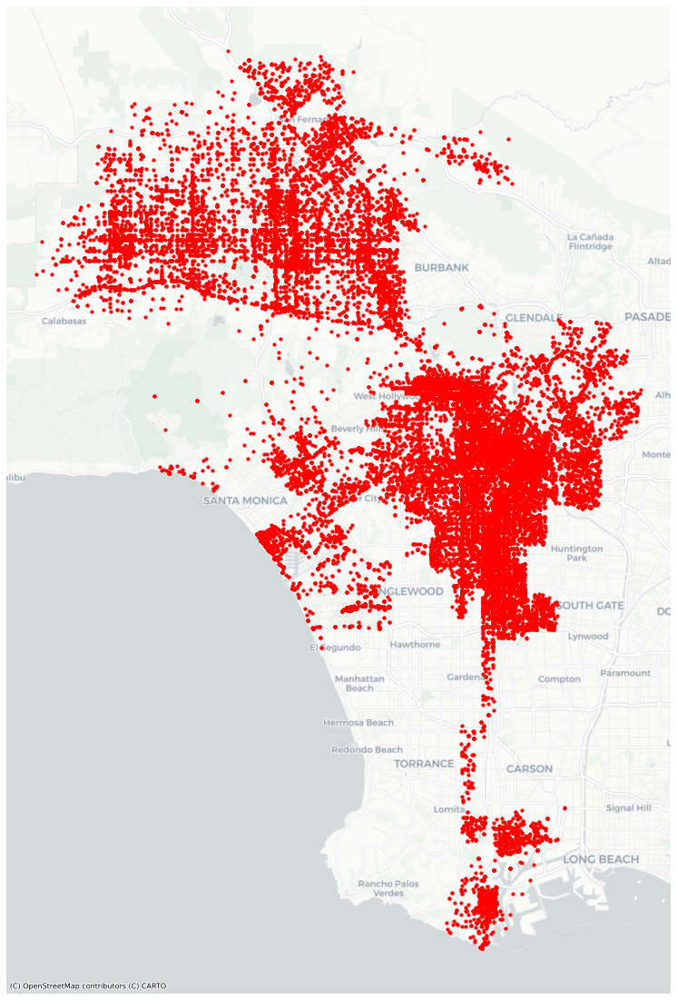

In [28]:
fig,ax = plt.subplots(figsize=(20,20))

arrests.plot(ax=ax,
             color='red',
             markersize=10)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [29]:
minx, miny, maxx, maxy = arrests.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-13209983.409812633
-13153344.052897016
3989406.377542009
4073563.4747085082


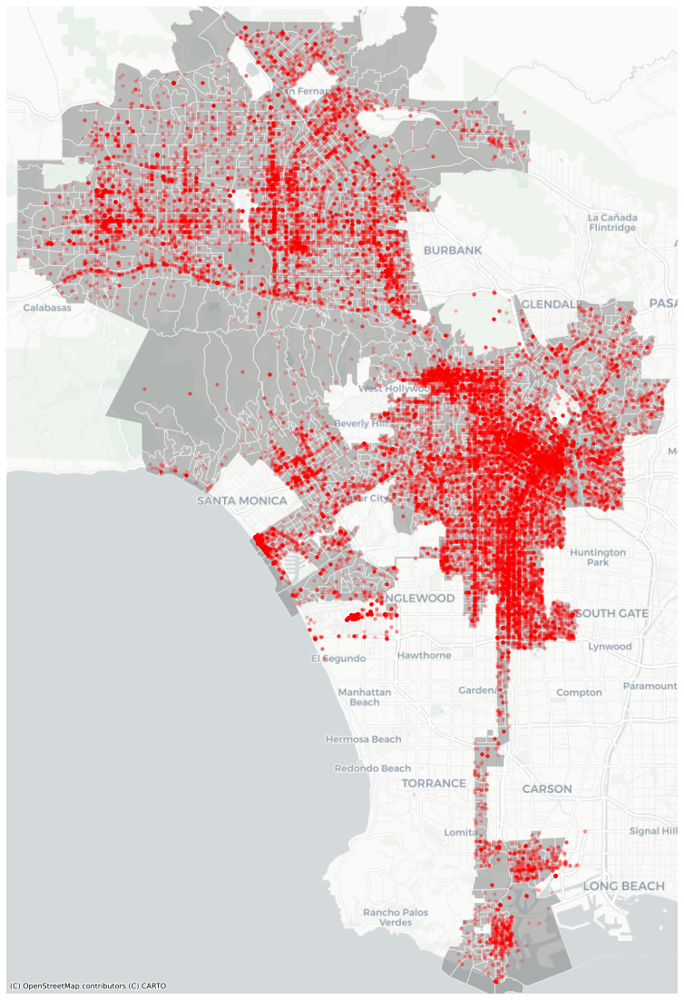

In [30]:

fig, ax = plt.subplots(figsize=(20, 20))

# block groups
gdf.plot(ax=ax, # this puts it in the ax plot
        color='gray', 
        edgecolor='white',
        alpha=0.5)

# arrests
arrests.plot(ax=ax, # this also puts it in the same ax plot
            color='red',
            markersize=10,
            alpha=0.2)

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx - 1000, maxx + 1000) # added/substracted value is to give some margin around total bounds
ax.set_ylim(miny - 1000, maxy + 1000)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

Now, lets do a spatial join of our data and merge our arrest data with our census block total pop data

In [31]:

join = gpd.sjoin(arrests, gdf, how='left')
join.head()

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,location_1,bkg_date,bkg_time,bgk_location,bkg_loc_cd,crsst,geometry,index_right,FIPS,TotalPop
0,6267132,BOOKING,2021-10-23T00:00:00.000,1000,06,Hollywood,0669,40,M,H,...,"{'type': 'Point', 'coordinates': [-118.3048, 3...",2021-10-23T00:00:00.000,1131,HOLLYWOOD,4206,NaN,POINT (-13169630.094 4041283.058),1036.0,060371911202,2000.0
1,6267204,BOOKING,2021-10-23T00:00:00.000,1350,10,West Valley,1039,29,M,H,...,"{'type': 'Point', 'coordinates': [-118.4749, 3...",2021-10-23T00:00:00.000,1650,VALLEY - JAIL DIV,4279,HASKELL,POINT (-13188565.540 4054867.870),536.0,060371276061,925.0
2,6267139,BOOKING,2021-10-23T00:00:00.000,1016,15,N Hollywood,1503,32,M,H,...,"{'type': 'Point', 'coordinates': [-118.4002, 3...",2021-10-23T00:00:00.000,1207,VALLEY - JAIL DIV,4279,SHERMAN WY,POINT (-13180249.974 4055729.237),418.0,060371233012,2511.0
3,6267329,BOOKING,2021-10-23T00:00:00.000,2130,16,Foothill,1672,20,M,H,...,"{'type': 'Point', 'coordinates': [-118.389, 34...",2021-10-23T00:00:00.000,2333,VALLEY - JAIL DIV,4279,NaN,POINT (-13179003.196 4060279.419),372.0,060371212223,1180.0
4,6267334,BOOKING,2021-10-23T00:00:00.000,2040,18,Southeast,1864,25,M,B,...,"{'type': 'Point', 'coordinates': [-118.2565, 3...",2021-10-24T00:00:00.000,0001,77TH ST,4212,CLOVIS AV,POINT (-13164253.363 4019259.024),2010.0,060372410013,1658.0


Next, we'll create a dataframe that countd crime by block group

In [32]:
arrests_by_gdf = join.FIPS.value_counts().rename_axis('FIPS').reset_index(name='arrests_count')

In [33]:
arrests_by_gdf.head()

,FIPS,arrests_count
0,060371282101,565
1,060372088011,514
2,060372734022,446
3,060372074001,309
4,060372077101,272


In [34]:
gdf=gdf.merge(arrests_by_gdf,on='FIPS')

In [35]:
gdf.head()

,FIPS,TotalPop,geometry,arrests_count
0,060371011101,1688.0,"MULTIPOLYGON (((-13168130.287 4063777.973, -13...",3
1,060371011102,1614.0,"MULTIPOLYGON (((-13169350.794 4063591.834, -13...",3
2,060371011103,981.0,"MULTIPOLYGON (((-13169185.150 4064208.314, -13...",2
3,060371011221,2156.0,"MULTIPOLYGON (((-13169467.902 4065613.937, -13...",1
4,060371012101,3047.0,"MULTIPOLYGON (((-13168465.581 4062734.852, -13...",8


Let's normalize the data by number of people who live in the census block group

Let's look at number of arrests per 1,000 people

In [36]:
gdf['arrests_per_1000'] = gdf['arrests_count']/gdf['TotalPop']*1000

In [37]:
gdf.sort_values(by="arrests_per_1000").tail()

,FIPS,TotalPop,geometry,arrests_count,arrests_per_1000
1218,060372074001,1539.0,"MULTIPOLYGON (((-13163883.226 4036698.552, -13...",309,200.779727
1797,060372376004,924.0,"MULTIPOLYGON (((-13167410.829 4025590.204, -13...",216,233.766234
1247,060372088011,1960.0,"MULTIPOLYGON (((-13166927.035 4036610.273, -13...",514,262.244898
2139,060372735022,386.0,"MULTIPOLYGON (((-13189115.569 4026857.882, -13...",125,323.834197
2135,060372734022,680.0,"MULTIPOLYGON (((-13189821.780 4027960.015, -13...",446,655.882353


Now, let's make a choropleth map. To do so, we have to connect the counts back to the block group gdf... Lets look at the top 25 locations first.

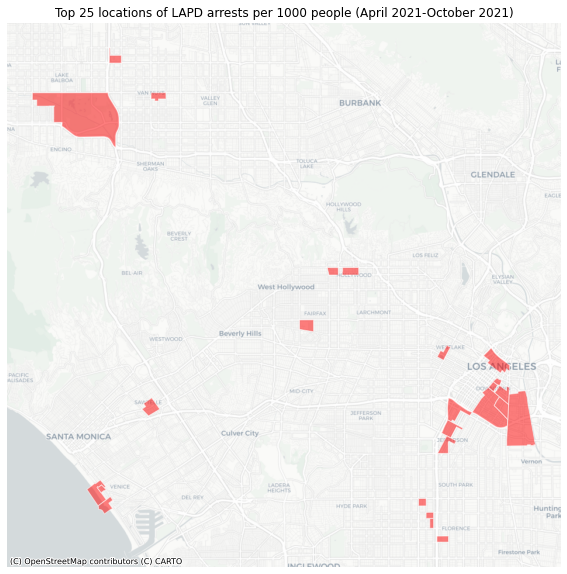

In [38]:
fig,ax = plt.subplots(figsize=(12,10))
gdf.sort_values(by='arrests_per_1000',ascending=False)[:25].plot(ax=ax,
                                                                 color='red',
                                                                 edgecolor='white',
                                                                 alpha=0.5,legend=True)


# title
ax.set_title('Top 25 locations of LAPD arrests per 1000 people (April 2021-October 2021)')

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

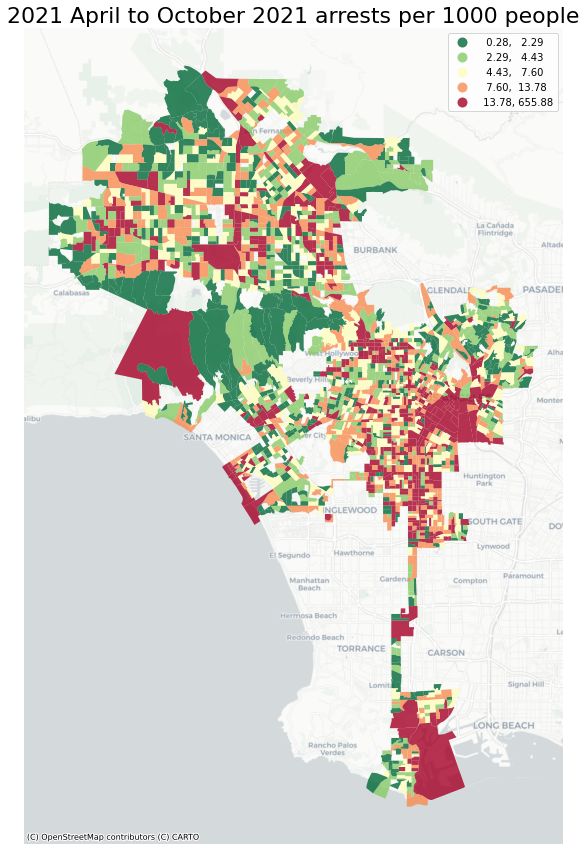

In [39]:
fig,ax = plt.subplots(figsize=(15,15))

gdf.plot(ax=ax,
        column='arrests_per_1000',
        legend=True,
        alpha=0.8,
        cmap='RdYlGn_r',
        scheme='quantiles')

ax.axis('off')
ax.set_title('2021 April to October 2021 arrests per 1000 people',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

Now, let's calculate and determine the spatial weight...

In [40]:
wq =  lps.weights.KNN.from_dataframe(gdf,k=8)

# Row-standardization
wq.transform = 'r'

The, let's prepare for assessing the spatial lag

In [41]:
gdf['arrests_per_1000_lag'] = lps.weights.lag_spatial(wq, gdf['arrests_per_1000'])

In [42]:
gdf.sample(10)[['FIPS','TotalPop','arrests_count','arrests_per_1000','arrests_per_1000_lag']]

,FIPS,TotalPop,arrests_count,arrests_per_1000,arrests_per_1000_lag
1889,060372405003,1476.0,13,8.807588,22.072572
1156,060372037102,1819.0,9,4.947774,6.123726
1509,060372201003,709.0,8,11.283498,6.496974
1670,060372317202,986.0,79,80.121704,13.476998
1987,060372641021,2998.0,4,1.334223,3.573830
112,060371066041,498.0,9,18.072289,8.553617
44,060371041242,1532.0,3,1.958225,3.952710
56,060371043202,913.0,9,9.857612,17.201878
1068,060371958042,1207.0,3,2.485501,6.407950
2130,060372732004,1008.0,2,1.984127,12.829647


Now, let's look at the difference between arrest spatial lag because we'll be calculating the highest negative difference with a donut and then calculating the highest positive difference

In [43]:
gdf['arrest_lag_diff'] = gdf['arrests_per_1000'] - gdf['arrests_per_1000_lag']

In [44]:
gdf.sort_values(by='arrest_lag_diff')

,FIPS,TotalPop,geometry,arrests_count,arrests_per_1000,arrests_per_1000_lag,arrest_lag_diff
2136,060372734023,674.0,"MULTIPOLYGON (((-13188866.770 4027756.604, -13...",54,80.118694,150.868581,-70.749886
2153,060372739022,1030.0,"MULTIPOLYGON (((-13188028.423 4026791.427, -13...",5,4.854369,68.160168,-63.305799
1795,060372376002,1020.0,"MULTIPOLYGON (((-13167656.845 4025515.165, -13...",8,7.843137,65.713569,-57.870432
948,060371907003,993.0,"MULTIPOLYGON (((-13173396.589 4041721.285, -13...",6,6.042296,59.615777,-53.573481
934,060371902021,1271.0,"MULTIPOLYGON (((-13173404.159 4042716.633, -13...",19,14.948859,66.459509,-51.510650
...,...,...,...,...,...,...,...
1218,060372074001,1539.0,"MULTIPOLYGON (((-13163883.226 4036698.552, -13...",309,200.779727,32.026529,168.753198
1797,060372376004,924.0,"MULTIPOLYGON (((-13167410.829 4025590.204, -13...",216,233.766234,37.473182,196.293052
2139,060372735022,386.0,"MULTIPOLYGON (((-13189115.569 4026857.882, -13...",125,323.834197,123.102217,200.731980
1247,060372088011,1960.0,"MULTIPOLYGON (((-13166927.035 4036610.273, -13...",514,262.244898,26.618737,235.626161


Now look, to the right we have columns for our arrests per 1000 spatial lag as well as our spatial lag difference... Let's take a look at our highest negative difference now.

In [45]:
gdf_donut = gdf.sort_values(by='arrest_lag_diff').head(1)
gdf_donut

,FIPS,TotalPop,geometry,arrests_count,arrests_per_1000,arrests_per_1000_lag,arrest_lag_diff
2136,060372734023,674.0,"MULTIPOLYGON (((-13188866.770 4027756.604, -13...",54,80.118694,150.868581,-70.749886


Okay, now lets calculate our FIPS highest positive difference...

In [46]:
gdf_diamond = gdf.sort_values(by='arrest_lag_diff').tail(1)
gdf_diamond

,FIPS,TotalPop,geometry,arrests_count,arrests_per_1000,arrests_per_1000_lag,arrest_lag_diff
2135,060372734022,680.0,"MULTIPOLYGON (((-13189821.780 4027960.015, -13...",446,655.882353,85.678784,570.203569


Okay, it might be best to start visualizing this to get a better understanding of what this data means. So let's display these using satellite imagery.

In [47]:
token = 'pk.eyJ1Ijoiam1lbDIxIiwiYSI6ImNrd3BwaHFndzBmMTEycXMyazZjM2J5czAifQ.EDDFydrpo4DMAzpYOceYLw'
px.set_mapbox_access_token(token)

In [48]:
# subset donut, project to WGS84, and get its centroid
gdf_donut = gdf_donut.to_crs('epsg:4326')

# what's the centroid?
minx, miny, maxx, maxy = gdf_donut.geometry.total_bounds
center_lat_donut = (maxy-miny)/2+miny
center_lon_donut = (maxx-minx)/2+minx

In [49]:
# subset diamond, project to WGS84, and get its centroid
gdf_diamond = gdf_diamond.to_crs('epsg:4326')

# what's the centroid?
minx, miny, maxx, maxy = gdf_diamond.geometry.total_bounds
center_lat_diamond = (maxy-miny)/2+miny
center_lon_diamond = (maxx-minx)/2+minx

Let's bring in plotly's choropleth mapbox

Visualizing data for the donut...

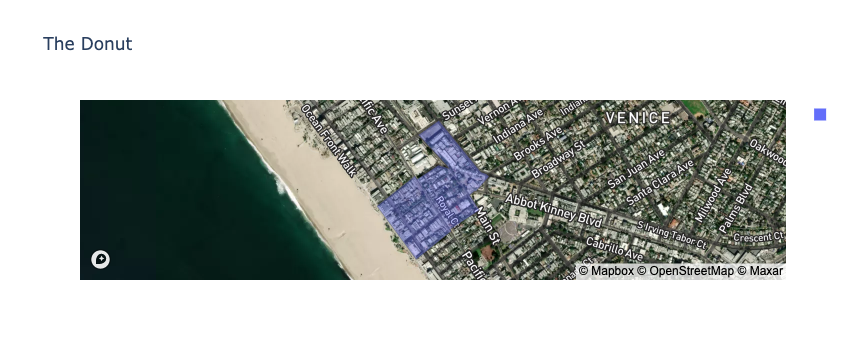

In [51]:
px.choropleth_mapbox(gdf_donut, 
                     geojson=gdf_donut.geometry, 
                     locations=gdf_donut.index, 
                     mapbox_style="satellite-streets",
                     zoom=14, 
                     center = {"lat": center_lat_donut, "lon": center_lon_donut},
                     hover_data=['FIPS','TotalPop','arrests_count','arrests_per_1000','arrests_per_1000_lag'],
                     opacity=0.4,
                     title='The Donut')

Now, for the diamond

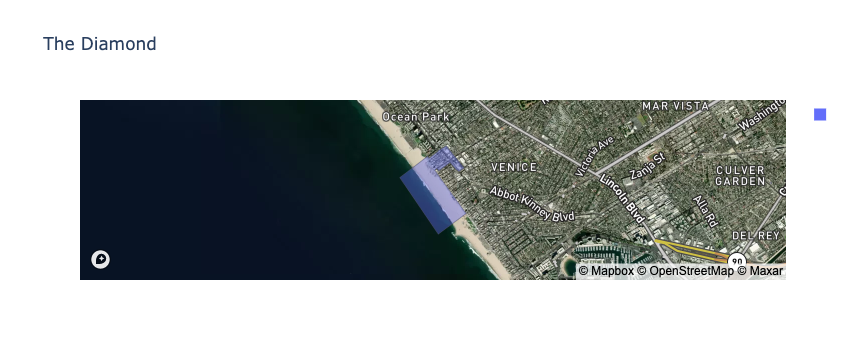

In [52]:
px.choropleth_mapbox(gdf_diamond, 
                     geojson=gdf_diamond.geometry, 
                     locations=gdf_diamond.index, 
                     mapbox_style="satellite-streets",
                     zoom=12, 
                     center = {"lat": center_lat_diamond, "lon": center_lon_diamond},
                     hover_data=['FIPS','TotalPop','arrests_count','arrests_per_1000','arrests_per_1000_lag'],
                     opacity=0.4,
                     title='The Diamond')

Here, our donut is Venice Beach and it had an arrest rate of 80 over 1000 people. Additionally, it has a spatial lag of 150. 

Our diamond, is the Venice Beach Boardwalk and it had an arrest rate of 655 over 1000 people. Is law enforcement just posted up at the boardwalk waiting for people to arrest? It also had a spatial lag of 85!

Moving on, let's see if we can map out our arrest data with our spatial lag

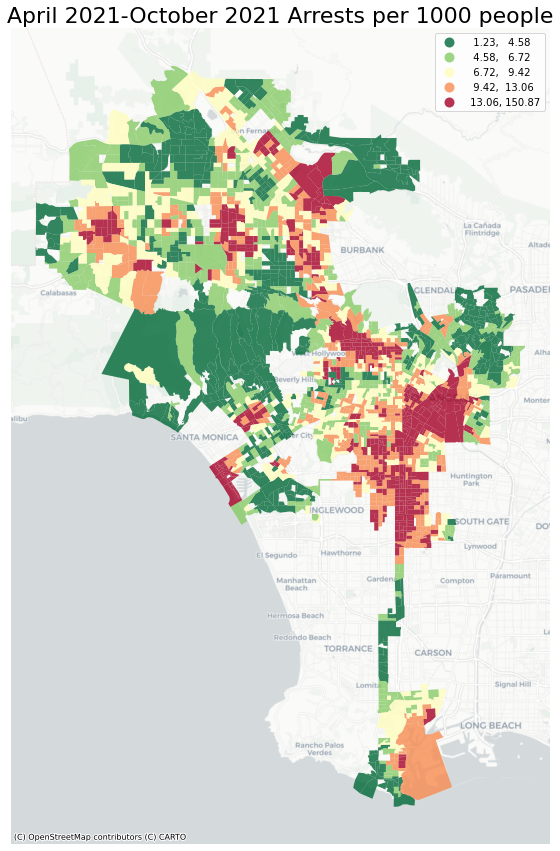

In [53]:
# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
gdf.plot(ax=ax,
         figsize=(15,15),
         column='arrests_per_1000_lag',
         legend=True,
         alpha=0.8,
         cmap='RdYlGn_r',
         scheme='quantiles')

ax.axis('off')
ax.set_title('April 2021-October 2021 Arrests per 1000 people',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

Now, lets bring in both maps (1) with Arrests per 1000 people and (2) with the spatial lag

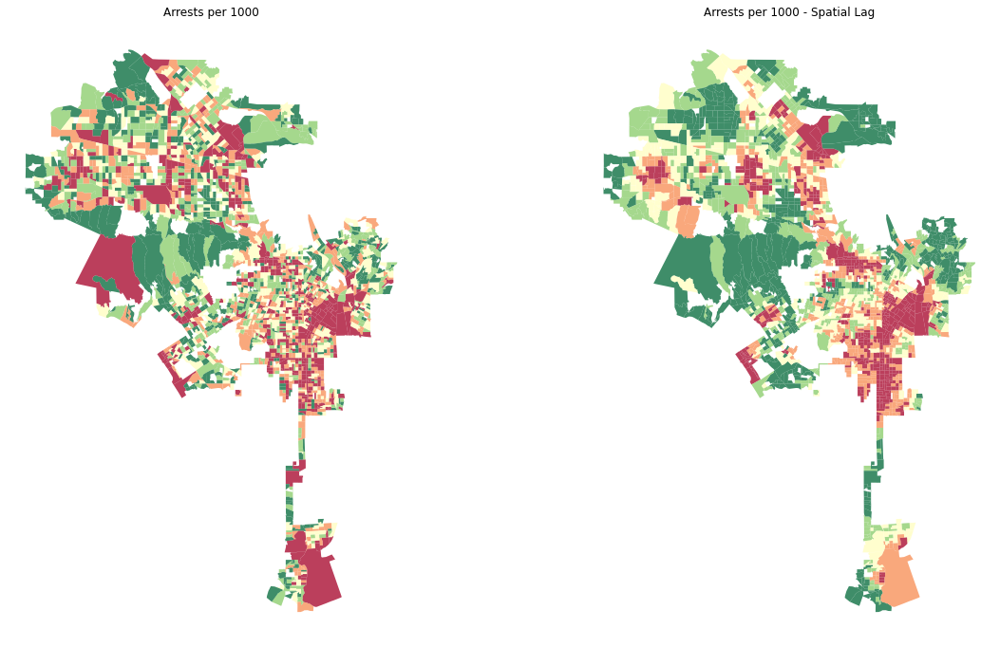

In [54]:
# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 12))

# two subplots produces ax[0] (left) and ax[1] (right)

# regular count map on the left
gdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='arrests_per_1000', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75, 
           )


ax[0].axis("off")
ax[0].set_title("Arrests per 1000")

# spatial lag map on the right
gdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='arrests_per_1000_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75
           )

ax[1].axis("off")
ax[1].set_title("Arrests per 1000 - Spatial Lag")

plt.show()

Let's bring in a satellite map to place under this visualization

In [55]:
# interactive version needs to be in WGS84
gdf_web = gdf.to_crs('EPSG:4326')

In [56]:
# what's the centroid?
minx, miny, maxx, maxy = gdf_web.geometry.total_bounds
center_lat_gdf_web = (maxy-miny)/2+miny
center_lon_gdf_web = (maxx-minx)/2+minx

In [57]:
# grab the median
median = gdf_web.arrests_per_1000_lag.median()

fig = px.choropleth_mapbox(gdf_web, 
                     geojson=gdf_web.geometry, # the geometry column
                     locations=gdf_web.index, # the index
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     color='arrests_per_1000_lag',
                     color_continuous_scale='RdYlGn_r',
                     color_continuous_midpoint =median, # put the median as the midpoint
                     range_color =(0,median*2),
                     hover_data=['FIPS','TotalPop','arrests_count','arrests_per_1000','arrests_per_1000_lag'],
                     center = {"lat": center_lat_gdf_web, "lon": center_lon_gdf_web},
                     opacity=0.8,
                     width=1000,
                     height=800,
                     labels={
                             'arrests_per_1000_lag':'Arrests per 1000 (Spatial Lag)',
                             'arrests_per_1000':'Arrests per 1000',
                     })
fig.update_traces(marker_line_width=0.1, marker_line_color='white')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

Moving on to our Moran's Plot to quantify the degree of the spatial correlations we see mapped out above. To start we do a global autocorrelation for arrests.

In [59]:
y = gdf.arrests_per_1000
moran = Moran(y, wq)
moran.I

0.21107643504499765

Okay, it looks like we have a positive value

Let's display it as a scatterplot

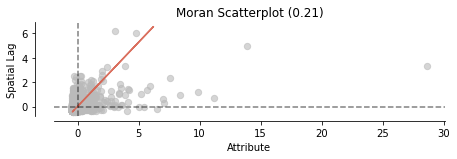

In [60]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

In order to understand what the 0.21 means, or rather, how likely is our observed pattern on the map generated by an entirely random process? We need to compare our value with a simulation of 999 permutations that randomly shuffles the arrest data throughout the given geographies

(<Figure size 504x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Reference Distribution'}, xlabel='Moran I: 0.21', ylabel='Density'>)

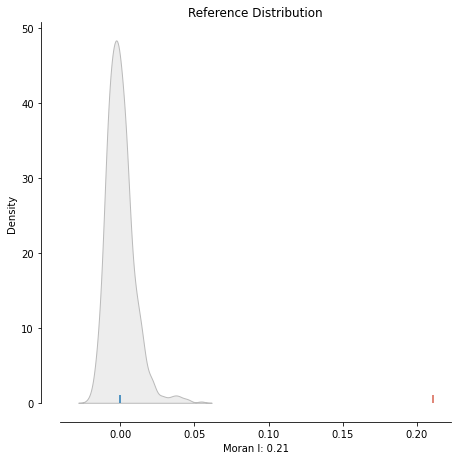

In [61]:
plot_moran_simulation(moran,aspect_equal=False)

In [62]:
moran.p_sim

0.001

Here, only 0.1% of our observed pattern would display a larger (absolute) value than the one we obtain from the observed data, and the other 99.9% of the random maps would receive a smaller (absolute) value of Moran’s I.

Now, let's create a Moran Local Scatterplot

In [63]:
lisa = esda.moran.Moran_Local(y, wq)

Let's plot it and add some labels...

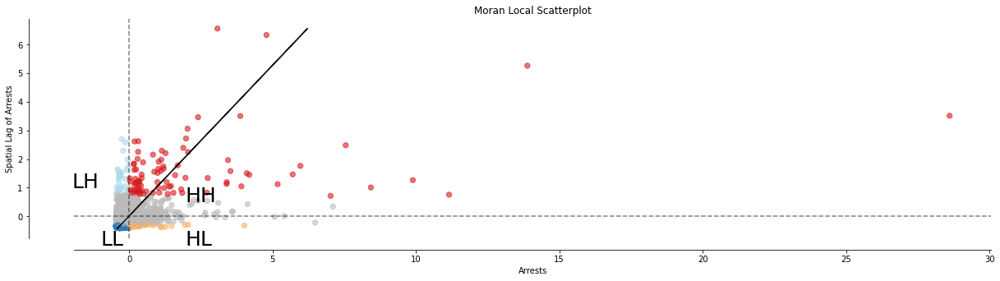

In [64]:
fig,ax = plt.subplots(figsize=(20,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Arrests")
ax.set_ylabel('Spatial Lag of Arrests')

plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

The colored dots represent the census block groups that have a P-value less that 0.05 in each quadrant. Essentially, these are the statisticaly significantly, spatially autocorrelated locations.

Finally, let's visualize these statistically significant clusters with a spatial autocorrelation map

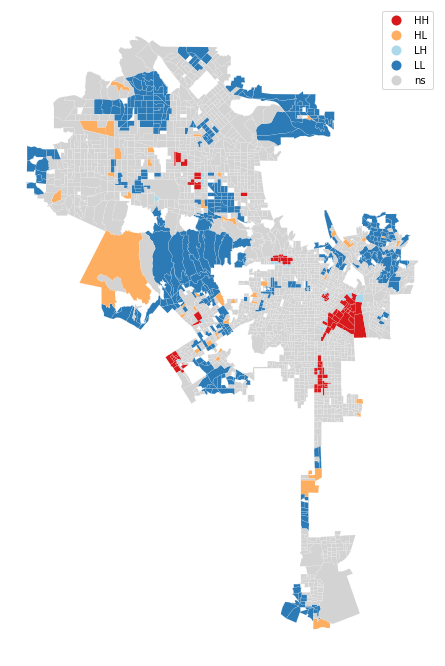

In [65]:
fig, ax = plt.subplots(figsize=(14,12))
lisa_cluster(lisa, gdf, p=0.05, ax=ax)
plt.show()

WE can also visualize and compare different p-value maps

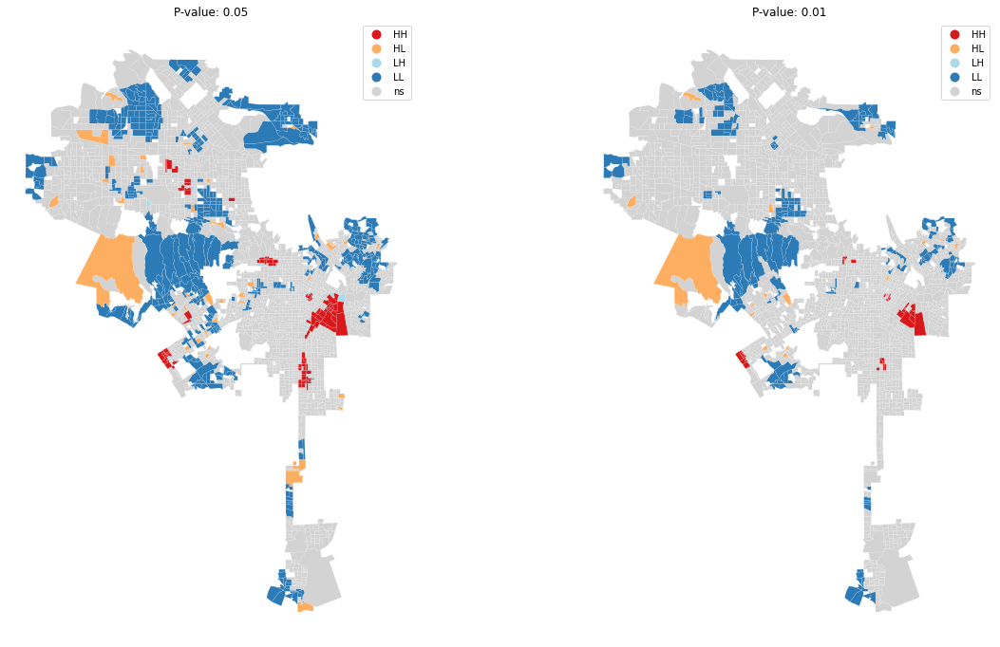

In [66]:
# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 12))

# regular count map on the left
lisa_cluster(lisa, gdf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

# spatial lag map on the right
lisa_cluster(lisa, gdf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

plt.show()

Let's try this spatial autocorrelation again, but this time let's look at data during the pandemic from its onset in March 2020 up until December 2020, just before Los Angeles became the epicenter.

In [67]:
import pandas as pd

# to import data from LA Data portal
from sodapy import Socrata

# to create spatial data
import geopandas as gpd

# for basemaps
import contextily as ctx

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

In [68]:
gdf_tracts = gpd.read_file('data/tracts.geojson')

In [69]:
gdf = gpd.read_file('data/acs2019_5yr_B01003_15000US060372672002.geojson')

<AxesSubplot:>

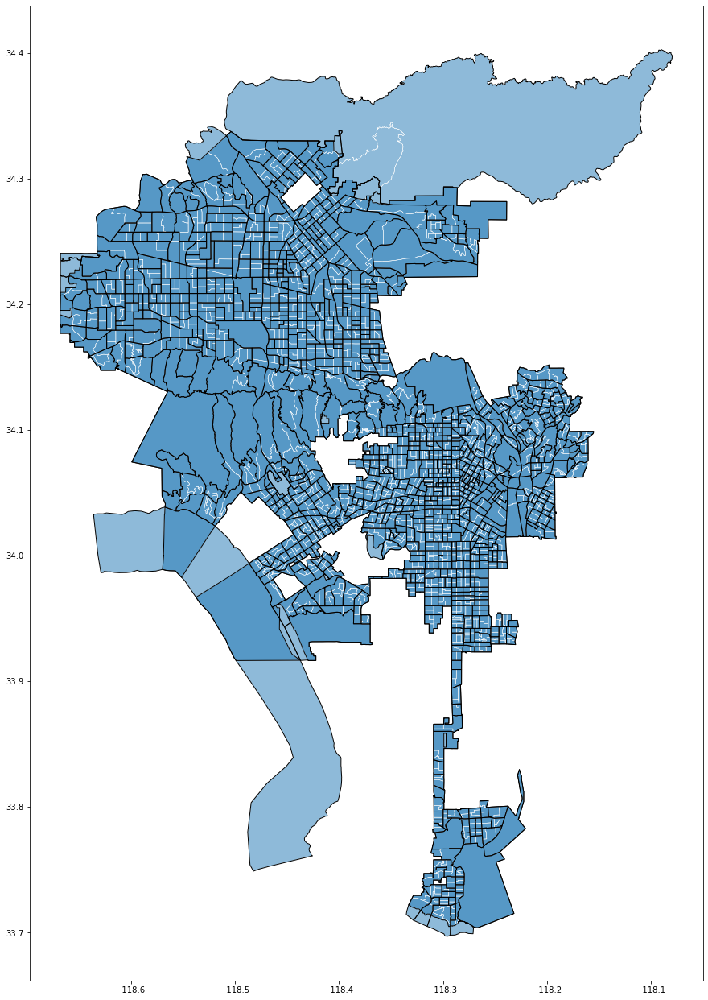

In [70]:
fig,ax = plt.subplots(figsize=(15,80))

# blue background of census tracts
gdf_tracts.plot(ax=ax,zorder=10,alpha=0.5)
# alpha is transparency

# while lines to show block groups (sandwiched between the two layers above for visual clarity)
gdf.boundary.plot(ax=ax,color='white',zorder=15,lw=0.5)
# drawing not filling in

# black boundary lines of census tracts on top of everything
gdf_tracts.boundary.plot(ax=ax,color='black',zorder=20,lw=1)

In [71]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2516 entries, 0 to 2515
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geoid             2516 non-null   object  
 1   name              2516 non-null   object  
 2   B01003001         2516 non-null   float64 
 3   B01003001, Error  2516 non-null   float64 
 4   geometry          2516 non-null   geometry
dtypes: float64(2), geometry(1), object(2)
memory usage: 98.4+ KB


In [72]:
gdf = gdf[['geoid','B01003001','geometry']]

Okay, we should probably rename the columns to get a better understanding of what they represent

In [73]:
gdf.columns = ['FIPS','TotalPop','geometry']

In [74]:
gdf.tail()

,FIPS,TotalPop,geometry
2511,15000US060379800261,26.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
2512,15000US060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2513,15000US060379800311,1175.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
2514,15000US060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."
2515,16000US0644000,3966936.0,"MULTIPOLYGON (((-118.66818 34.18987, -118.6681..."


In [75]:
gdf=gdf.drop(2515)

In [76]:
gdf.tail()

,FIPS,TotalPop,geometry
2510,15000US060379800241,223.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184..."
2511,15000US060379800261,26.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
2512,15000US060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2513,15000US060379800311,1175.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
2514,15000US060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."


Let's clean up the FIPS code a bit...

In [77]:
gdf['FIPS'] = gdf['FIPS'].str.replace('15000US','')
gdf.tail()

,FIPS,TotalPop,geometry
2510,060379800241,223.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184..."
2511,060379800261,26.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
2512,060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2513,060379800311,1175.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
2514,060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."


We should probably clean up the data a bit more so let's sort by dropping total populations of less than 100

In [78]:
gdf.sort_values(by='TotalPop').head(20)

,FIPS,TotalPop,geometry
2514,060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."
2358,060372772002,0.0,"MULTIPOLYGON (((-118.38597 33.94734, -118.3859..."
2512,060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2509,060379800231,0.0,"MULTIPOLYGON (((-118.64870 34.23120, -118.6480..."
2506,060379800201,0.0,"MULTIPOLYGON (((-118.34412 34.21700, -118.3438..."
2508,060379800221,0.0,"MULTIPOLYGON (((-118.50266 34.30809, -118.5026..."
2501,060379800091,5.0,"MULTIPOLYGON (((-118.33707 34.14160, -118.3361..."
2503,060379800141,9.0,"MULTIPOLYGON (((-118.26088 33.76850, -118.2602..."
2511,060379800261,26.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
2507,060379800211,33.0,"MULTIPOLYGON (((-118.40183 34.26509, -118.4017..."


In [79]:
gdf = gdf[gdf['TotalPop']>100]
gdf.head(20)

,FIPS,TotalPop,geometry
0,060371011101,1688.0,"MULTIPOLYGON (((-118.29133 34.26008, -118.2913..."
1,060371011102,1614.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
2,060371011103,981.0,"MULTIPOLYGON (((-118.30080 34.26327, -118.2979..."
3,060371011221,2156.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
4,060371011222,1249.0,"MULTIPOLYGON (((-118.29075 34.26906, -118.2906..."
5,060371012101,3047.0,"MULTIPOLYGON (((-118.29434 34.25233, -118.2931..."
6,060371012102,3300.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
7,060371012201,1126.0,"MULTIPOLYGON (((-118.28592 34.25404, -118.2859..."
8,060371012202,2576.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2846..."
9,060371013001,1283.0,"MULTIPOLYGON (((-118.27817 34.25577, -118.2781..."


Perfect! Let's plot this on the map now!

In [80]:
gdf = gdf.to_crs(epsg=3857)

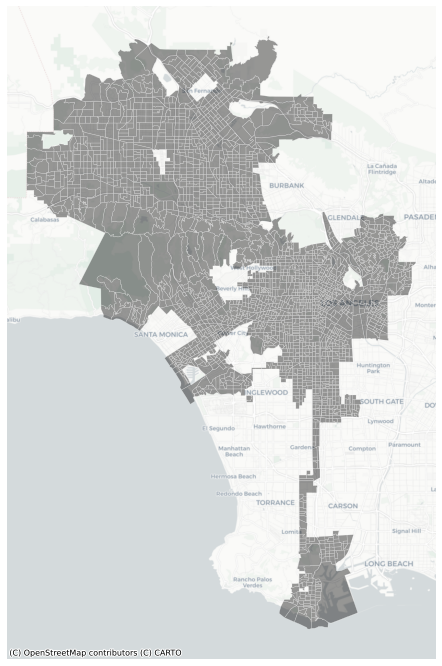

In [81]:
fig, ax = plt.subplots(figsize=(12,12))

gdf.plot(ax=ax,
         color='black', 
         edgecolor='white',
         lw=0.5,
         alpha=0.4)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

Moving it along... let's plot some arrest data now! First, we should probably bring in the data from Open Data LA

In [82]:
client = Socrata("data.lacity.org", None)

results = client.get("amvf-fr72", 
                     limit=50000,
                     where = "arst_date between '2020-02-01T00:00:00' and '2020-12-31T00:00:00'",
                     order='arst_date desc')

# Convert to pandas DataFrame
arrests = pd.DataFrame.from_records(results)

Okay, so in class we brought in data from April to October of 2021 and the visualization helped us make connections to the policing of houselessness among other trends like the high concentration of arrests in more urban areas where there is a higher population of black and brown people, including South LA. For this part of our data, we want to visualize data from the beginning of the pandemic- March 2020 to December 2020 to see if the visualizations will tell us anything about the way Covid impacted arrests, or the summer uprisings, or even the spikes in cases we saw towards the end of the year last year. 

In [83]:
arrests.shape

(50000, 25)

So already we're seeing more arrests than we did when we visualized data for March-October of this year, 2021. I thought we would see less since most people were at home during the beginning of the pandemic and we also had curfews implemented during the summer uprisings. Seems like police continued with business as usual. However, we are analyzing data for an addtional 2 months as compared to what we did for arrest data between March-October 2021. 

Let's convert our pandas data into a geodataframe to start!

In [84]:
import pandas as pd
import geopandas
import matplotlib.pyplot as plt

In [85]:
arrests = gpd.GeoDataFrame(arrests, 
                         crs='EPSG:4326',
                         geometry=gpd.points_from_xy(arrests.lon, arrests.lat))

In [86]:
arrests = arrests.to_crs(epsg=3857)
print(arrests.head())

      rpt_id report_type                arst_date  time area   area_desc  \
0    6091306     BOOKING  2020-12-31T00:00:00.000  2205   13      Newton   
1  201918627         RFC  2020-12-31T00:00:00.000  1535   19     Mission   
2    5937051     BOOKING  2020-12-31T00:00:00.000  2303   07    Wilshire   
3  211404850         RFC  2020-12-31T00:00:00.000  0830   14     Pacific   
4    6090846     BOOKING  2020-12-31T00:00:00.000  1630   04  Hollenbeck   

     rd age sex_cd descent_cd  ...                                 location  \
0  1342  24      M          B  ...  3800    WOODLAWN                     AV   
1  1994  31      F          H  ...                                   WILLIS   
2  0789  14      M          B  ...  1900    5TH                          AV   
3  1411  40      M          A  ...                                     NAVY   
4  0464  37      M          B  ...   200 N  BREED                        ST   

       lat        lon                                         locati

Remember to turn out lat/lons into floats!

In [87]:
arrests.lon = arrests.lon.astype('float')
arrests.lat = arrests.lat.astype('float')

Now, let's map out this data!

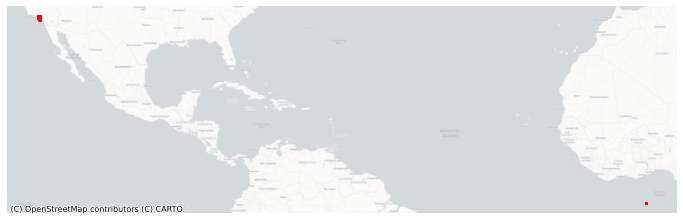

In [88]:
fig,ax = plt.subplots(figsize=(12,12))

arrests.plot(ax=ax,
             color='red',
             markersize=1)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

Now, we're going to look at the unmapped rows and drop them

In [89]:
arrests[arrests.lon==0]

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,location,lat,lon,location_1,bkg_date,bkg_time,bgk_location,bkg_loc_cd,crsst,geometry
1,201918627,RFC,2020-12-31T00:00:00.000,1535,19,Mission,1994,31,F,H,...,WILLIS,0.0,0.0,"{'type': 'Point', 'coordinates': [0, 0]}",NaN,NaN,NaN,NaN,ARMINTA,POINT (0.00000 0.00000)
9,201918622,RFC,2020-12-31T00:00:00.000,1600,19,Mission,1983,44,M,H,...,COLUMBUS AV,0.0,0.0,"{'type': 'Point', 'coordinates': [0, 0]}",NaN,NaN,NaN,NaN,PARTHENIA ST,POINT (0.00000 0.00000)
39,201918623,RFC,2020-12-31T00:00:00.000,1510,19,Mission,1995,38,M,H,...,7900 VAN NUYS BL,0.0,0.0,"{'type': 'Point', 'coordinates': [0, 0]}",NaN,NaN,NaN,NaN,NaN,POINT (0.00000 0.00000)
43,201918624,RFC,2020-12-31T00:00:00.000,1520,19,Mission,1995,45,M,H,...,CABRITO,0.0,0.0,"{'type': 'Point', 'coordinates': [0, 0]}",NaN,NaN,NaN,NaN,WILLIS,POINT (0.00000 0.00000)
90,201918626,RFC,2020-12-31T00:00:00.000,1530,19,Mission,1994,45,M,H,...,CABRITO RD,0.0,0.0,"{'type': 'Point', 'coordinates': [0, 0]}",NaN,NaN,NaN,NaN,WILLIS AV,POINT (0.00000 0.00000)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49935,200608705,RFC,2020-03-14T00:00:00.000,2230,06,Hollywood,0636,26,M,W,...,1700 VINE ST,0.0,0.0,"{'type': 'Point', 'coordinates': [0, 0]}",NaN,NaN,NaN,NaN,NaN,POINT (0.00000 0.00000)
49949,200608567,RFC,2020-03-14T00:00:00.000,1425,06,Hollywood,0666,45,F,O,...,LEXINGTON,0.0,0.0,"{'type': 'Point', 'coordinates': [0, 0]}",NaN,NaN,NaN,NaN,VINE,POINT (0.00000 0.00000)
49960,200608695,RFC,2020-03-14T00:00:00.000,2015,06,Hollywood,0646,25,M,B,...,CHEROKEE,0.0,0.0,"{'type': 'Point', 'coordinates': [0, 0]}",NaN,NaN,NaN,NaN,HOLLYWOOD,POINT (0.00000 0.00000)
49963,200608568,RFC,2020-03-14T00:00:00.000,2220,06,Hollywood,0636,25,M,W,...,1700 VINE ST,0.0,0.0,"{'type': 'Point', 'coordinates': [0, 0]}",NaN,NaN,NaN,NaN,NaN,POINT (0.00000 0.00000)


In [90]:
arrests = arrests[arrests.lon!=0]

Let's plot these arrests now

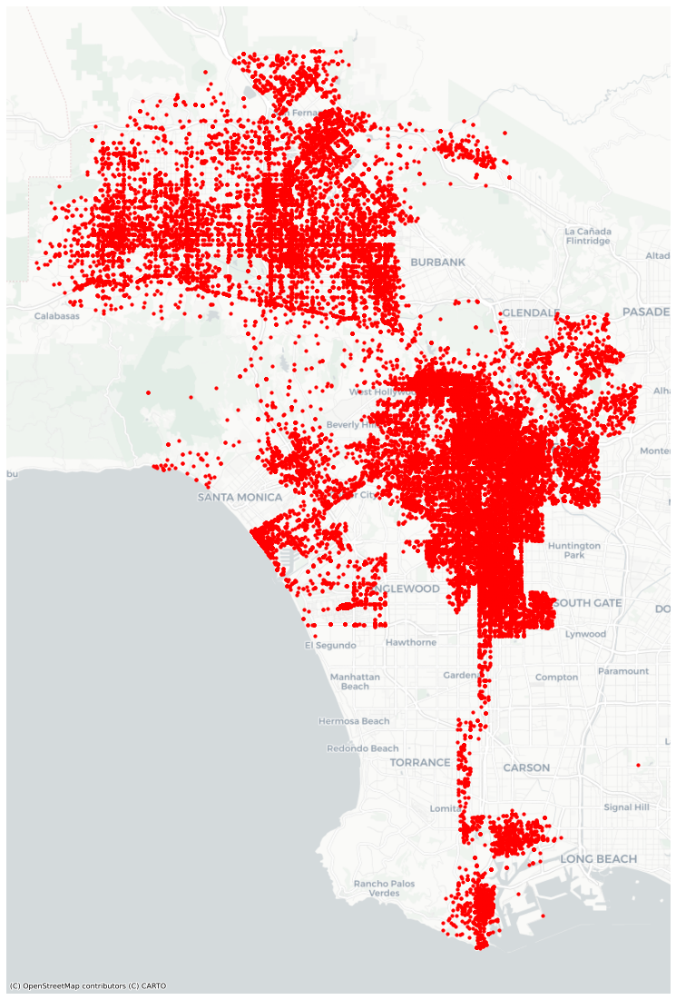

In [91]:
fig,ax = plt.subplots(figsize=(20,20))

arrests.plot(ax=ax,
             color='red',
             markersize=10)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

So we just mapped all the arrests between March 2020 to December 2020 onto by census blocks.

Now, in order to better understand the number of arrests within a census block, we should look into creating a spatial join for our data.

In [92]:
join = gpd.sjoin(arrests, gdf, how='left')
join.head()

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,location_1,bkg_date,bkg_time,bgk_location,bkg_loc_cd,crsst,geometry,index_right,FIPS,TotalPop
0,6091306,BOOKING,2020-12-31T00:00:00.000,2205,13,Newton,1342,24,M,B,...,"{'type': 'Point', 'coordinates': [-118.2728, 3...",2020-12-31T00:00:00.000,2356,METRO - JAIL DIVISION,4273,NaN,POINT (-13166067.871 4030413.447),1744.0,060372311003,1122.0
2,5937051,BOOKING,2020-12-31T00:00:00.000,2303,07,Wilshire,0789,14,M,B,...,"{'type': 'Point', 'coordinates': [-118.3225, 3...",2021-01-01T00:00:00.000,0502,METRO - JAIL DIVISION,4273,NaN,POINT (-13171600.449 4034080.277),1573.0,060372188001,1296.0
3,211404850,RFC,2020-12-31T00:00:00.000,0830,14,Pacific,1411,40,M,A,...,"{'type': 'Point', 'coordinates': [-118.4791, 3...",NaN,NaN,NaN,NaN,OCEAN FRONT WK,POINT (-13189033.082 4027701.020),2275.0,060372734022,680.0
4,6090846,BOOKING,2020-12-31T00:00:00.000,1630,04,Hollenbeck,0464,37,M,B,...,"{'type': 'Point', 'coordinates': [-118.2101, 3...",2020-12-31T00:00:00.000,1825,METRO - JAIL DIVISION,4273,NaN,POINT (-13159088.139 4034926.637),1262.0,060372044201,2341.0
5,201016557,RFC,2020-12-31T00:00:00.000,1240,10,West Valley,1063,28,M,W,...,"{'type': 'Point', 'coordinates': [-118.536, 34...",NaN,NaN,NaN,NaN,NaN,POINT (-13195367.161 4051665.233),767.0,060371394012,1833.0


But let's make a dataframe that counts the number of arrests by corresponding census block

In [93]:
arrests_by_gdf = join.FIPS.value_counts().rename_axis('FIPS').reset_index(name='arrests_count')

In [94]:
arrests_by_gdf.head()

,FIPS,arrests_count
0,060372088011,371
1,060372077101,358
2,060372734022,340
3,060371282101,316
4,060372063003,300


Now, we should look at merging the arrest counts to the census block groups to map it!

We're going to assess the number of arrests by the total population of census groups. 

In [95]:
gdf=gdf.merge(arrests_by_gdf,on='FIPS')

In [96]:
gdf.head()

,FIPS,TotalPop,geometry,arrests_count
0,060371011101,1688.0,"MULTIPOLYGON (((-13168130.287 4063777.973, -13...",2
1,060371011102,1614.0,"MULTIPOLYGON (((-13169350.794 4063591.834, -13...",12
2,060371011221,2156.0,"MULTIPOLYGON (((-13169467.902 4065613.937, -13...",6
3,060371011222,1249.0,"MULTIPOLYGON (((-13168066.056 4064987.278, -13...",3
4,060371012101,3047.0,"MULTIPOLYGON (((-13168465.581 4062734.852, -13...",24


Now, let's clean up the data a bit more and normalize it by the total number of people on a census group.

In [97]:
gdf['arrests_per_1000'] = gdf['arrests_count']/gdf['TotalPop']*1000


In [98]:
gdf.sort_values(by="arrests_per_1000").tail()

,FIPS,TotalPop,geometry,arrests_count,arrests_per_1000
1820,060372376001,1084.0,"MULTIPOLYGON (((-13167654.841 4026132.403, -13...",283,261.070111
1823,060372376004,924.0,"MULTIPOLYGON (((-13167410.829 4025590.204, -13...",258,279.220779
2382,060379800241,223.0,"MULTIPOLYGON (((-13193418.068 4053521.172, -13...",64,286.995516
2175,060372735022,386.0,"MULTIPOLYGON (((-13189115.569 4026857.882, -13...",133,344.559585
2171,060372734022,680.0,"MULTIPOLYGON (((-13189821.780 4027960.015, -13...",340,500.000000


Let's try to map out a portion of this dataframe to understand the top 25 blocks with the highest amount of arrests. 

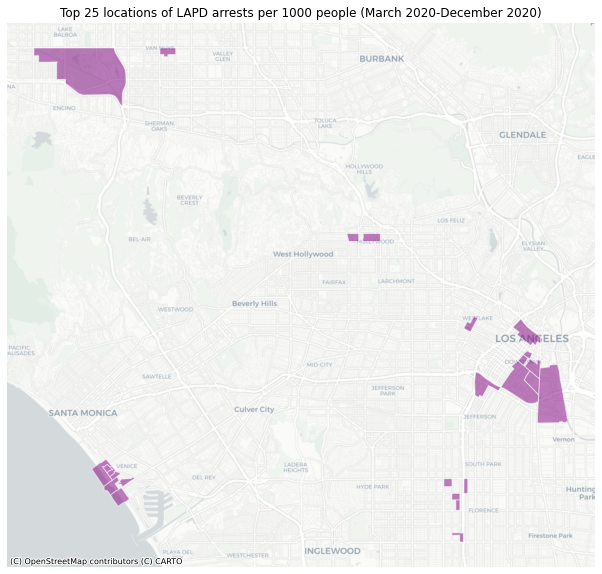

In [99]:
fig,ax = plt.subplots(figsize=(12,10))
gdf.sort_values(by='arrests_per_1000',ascending=False)[:25].plot(ax=ax,
                                                                 color='purple',
                                                                 edgecolor='white',
                                                                 alpha=0.5,legend=True)


# title
ax.set_title('Top 25 locations of LAPD arrests per 1000 people (March 2020-December 2020)')

ax.axis('off')

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

interesting to see that this looks no different than this years data from March to October of 2021. There are still high numbers of arrests done around or exactly within the same census blocks. Are these areas just targeted by police? 

Moving on, let's bring in a chloreopath of arrests

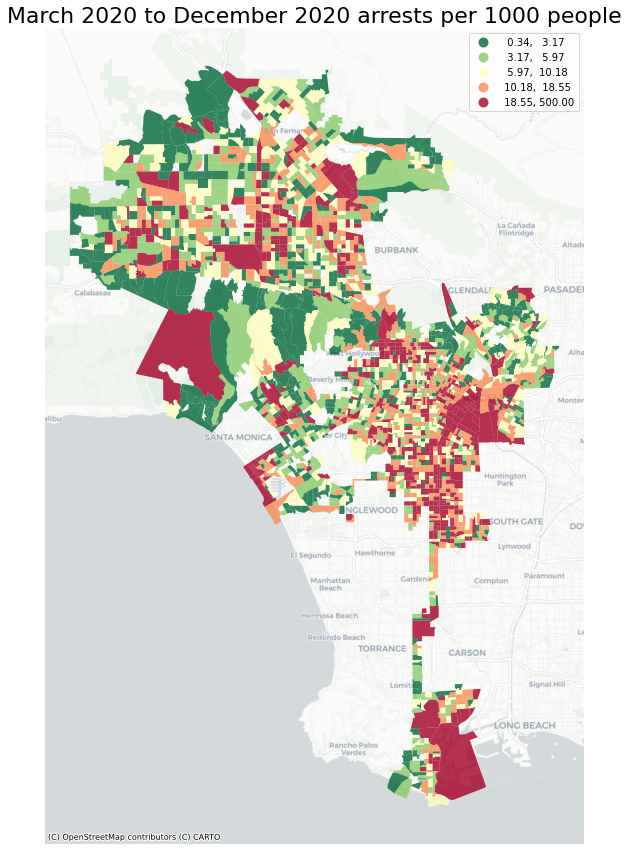

In [101]:
fig,ax = plt.subplots(figsize=(15,15))


gdf.plot(ax=ax,
        column='arrests_per_1000',
        legend=True,
        alpha=0.8,
        cmap='RdYlGn_r',
        scheme='quantiles')

ax.axis('off')
ax.set_title('March 2020 to December 2020 arrests per 1000 people',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

Now, lets calulate spatial weights to better understand the areas neighborhood.

In [102]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(gdf,k=8)

# Row-standardization
wq.transform = 'r'

Now that we have our spatial weights, we use it to calculate the spatial lag.

First, let's make a new column for the spatial lag

In [103]:
gdf['arrests_per_1000_lag'] = lps.weights.lag_spatial(wq, gdf['arrests_per_1000'])

In [104]:
gdf.sample(5)[['FIPS','TotalPop','arrests_count','arrests_per_1000','arrests_per_1000_lag']]

,FIPS,TotalPop,arrests_count,arrests_per_1000,arrests_per_1000_lag
485,060371256002,1061.0,5,4.712535,7.531250
271,060371174051,3574.0,43,12.031337,12.175686
687,060371352031,2336.0,8,3.424658,2.649910
2149,060372719023,2430.0,21,8.641975,4.289879
1412,060372145023,1563.0,3,1.919386,4.121480


Alright, we've calculated arrests per 1000 and calculated the spatial lag but what does this tell us? 

Let's look at what the donut and diamont tell us...

First we have to create a column that that calculates the difference betwen arrests and lag

In [105]:
gdf['arrest_lag_diff'] = gdf['arrests_per_1000'] - gdf['arrests_per_1000_lag']

In [106]:
gdf.sort_values(by='arrest_lag_diff')

,FIPS,TotalPop,geometry,arrests_count,arrests_per_1000,arrests_per_1000_lag,arrest_lag_diff
2188,060372739022,1030.0,"MULTIPOLYGON (((-13188028.423 4026791.427, -13...",12,11.650485,88.602693,-76.952208
1821,060372376002,1020.0,"MULTIPOLYGON (((-13167656.845 4025515.165, -13...",17,16.666667,91.862231,-75.195564
966,060371907003,993.0,"MULTIPOLYGON (((-13173396.589 4041721.285, -13...",18,18.126888,88.363356,-70.236467
952,060371902021,1271.0,"MULTIPOLYGON (((-13173404.159 4042716.633, -13...",27,21.243116,87.093025,-65.849910
1822,060372376003,1073.0,"MULTIPOLYGON (((-13167166.705 4025522.146, -13...",24,22.367195,86.847378,-64.480183
...,...,...,...,...,...,...,...
964,060371907001,1130.0,"MULTIPOLYGON (((-13173138.328 4042197.304, -13...",288,254.867257,47.779167,207.088090
2175,060372735022,386.0,"MULTIPOLYGON (((-13189115.569 4026857.882, -13...",133,344.559585,136.718822,207.840764
1823,060372376004,924.0,"MULTIPOLYGON (((-13167410.829 4025590.204, -13...",258,279.220779,59.042967,220.177812
2382,060379800241,223.0,"MULTIPOLYGON (((-13193418.068 4053521.172, -13...",64,286.995516,6.425407,280.570109


Now, let's look at data for the FIPS with highest NEGATIVE difference

In [107]:
gdf_donut = gdf.sort_values(by='arrest_lag_diff').head(1)
gdf_donut

,FIPS,TotalPop,geometry,arrests_count,arrests_per_1000,arrests_per_1000_lag,arrest_lag_diff
2188,060372739022,1030.0,"MULTIPOLYGON (((-13188028.423 4026791.427, -13...",12,11.650485,88.602693,-76.952208


Perfect! Okay, now let's look at data for the FIPS with highest POSITIVE difference

In [108]:
gdf_diamond = gdf.sort_values(by='arrest_lag_diff').tail(1)
gdf_diamond

,FIPS,TotalPop,geometry,arrests_count,arrests_per_1000,arrests_per_1000_lag,arrest_lag_diff
2171,060372734022,680.0,"MULTIPOLYGON (((-13189821.780 4027960.015, -13...",340,500.0,110.443483,389.556517


BRING IN THE SATELLITE IMAGERY PLEASE!!!

In [109]:
token = 'pk.eyJ1Ijoiam1lbDIxIiwiYSI6ImNrd3BwaHFndzBmMTEycXMyazZjM2J5czAifQ.EDDFydrpo4DMAzpYOceYLw'
px.set_mapbox_access_token(token)

Okay, we have to subset the donut and get the centroid now...

In [110]:
# subset donut, project to WGS84, and get its centroid
gdf_donut = gdf_donut.to_crs('epsg:4326')

# what's the centroid?
minx, miny, maxx, maxy = gdf_donut.geometry.total_bounds
center_lat_donut = (maxy-miny)/2+miny
center_lon_donut = (maxx-minx)/2+minx

Next, we have to subset the diamond and get the centroid now...

In [111]:
# subset diamond, project to WGS84, and get its centroid
gdf_diamond = gdf_diamond.to_crs('epsg:4326')

# what's the centroid?
minx, miny, maxx, maxy = gdf_diamond.geometry.total_bounds
center_lat_diamond = (maxy-miny)/2+miny
center_lon_diamond = (maxx-minx)/2+minx

Let's map it out now!

First, the donut...

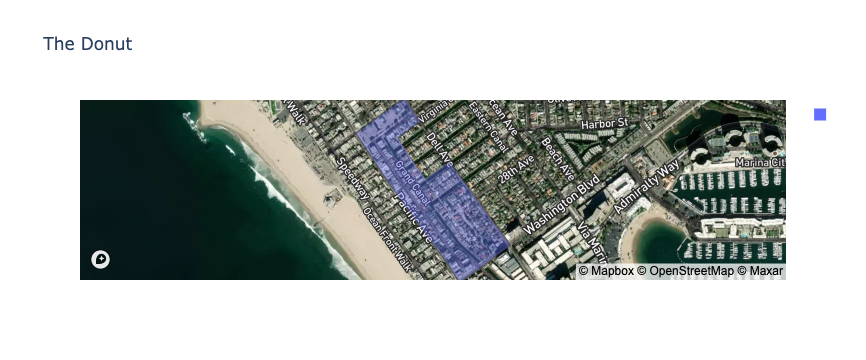

In [113]:
px.choropleth_mapbox(gdf_donut, 
                     geojson=gdf_donut.geometry, 
                     locations=gdf_donut.index, 
                     mapbox_style="satellite-streets",
                     zoom=14, 
                     center = {"lat": center_lat_donut, "lon": center_lon_donut},
                     hover_data=['FIPS','TotalPop','arrests_count','arrests_per_1000','arrests_per_1000_lag'],
                     opacity=0.4,
                     title='The Donut')

Next, the diamond...

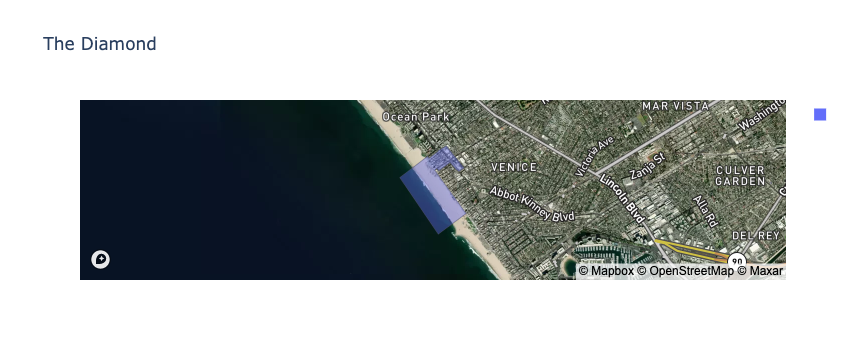

In [115]:
px.choropleth_mapbox(gdf_diamond, 
                     geojson=gdf_diamond.geometry, 
                     locations=gdf_diamond.index, 
                     mapbox_style="satellite-streets",
                     zoom=12, 
                     center = {"lat": center_lat_diamond, "lon": center_lon_diamond},
                     hover_data=['FIPS','TotalPop','arrests_count','arrests_per_1000','arrests_per_1000_lag'],
                     opacity=0.4,
                     title='The Diamond')

Interesting, here we see Venice again. The donut is located in Venice Beach, near the Venice Canal Historic District. It had an arrest rate of 11 per 1000 people and it had a spatial lag of 88!

Our diamond is once again along the Venice Beach Boardwalk. It had an arrest rate of 500 per 1000 people and it had a spatial lag of 110!!

Moving on, let's look at a spatial lag map...

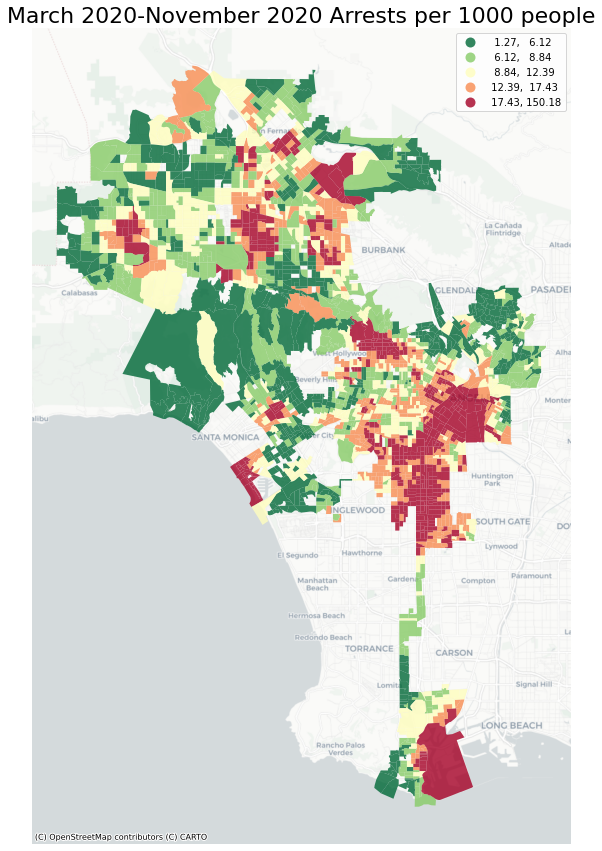

In [116]:
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
gdf.plot(ax=ax,
         figsize=(15,15),
         column='arrests_per_1000_lag',
         legend=True,
         alpha=0.8,
         cmap='RdYlGn_r',
         scheme='quantiles')

ax.axis('off')
ax.set_title('March 2020-November 2020 Arrests per 1000 people',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

Let's compare this spatial lag map to our map of arrests per 1000

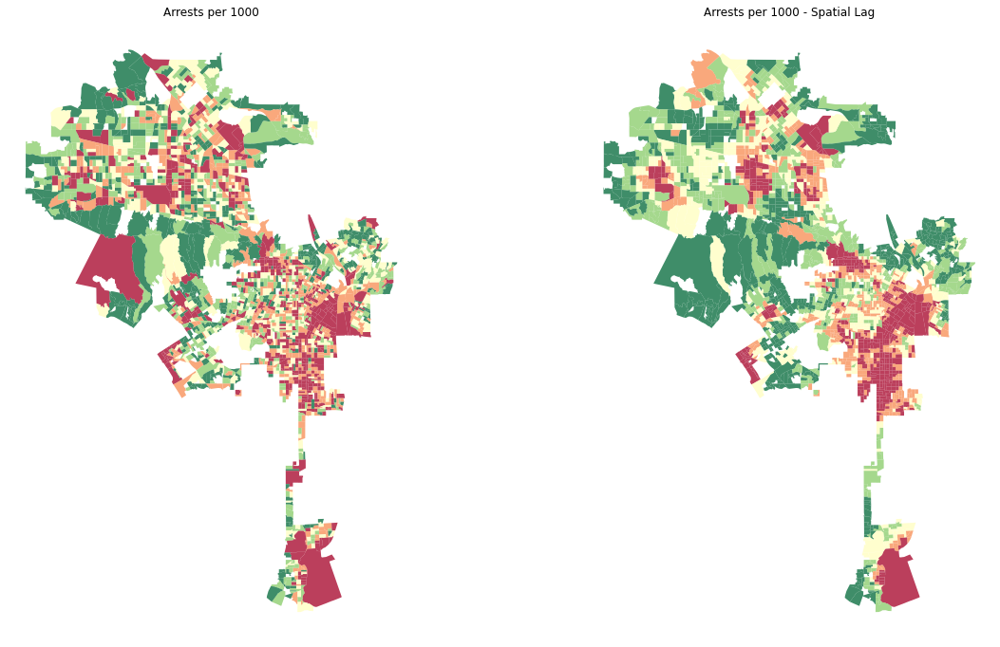

In [117]:
# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 12))

# two subplots produces ax[0] (left) and ax[1] (right)

# regular count map on the left
gdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='arrests_per_1000', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75, 
           )


ax[0].axis("off")
ax[0].set_title("Arrests per 1000")

# spatial lag map on the right
gdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='arrests_per_1000_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75
           )

ax[1].axis("off")
ax[1].set_title("Arrests per 1000 - Spatial Lag")

plt.show()

Now, let's get into the Moran's Plot to quantify the degree of the spatial correlations. To start, we test for global autocorrelation for arrest counts.

In [118]:
y = gdf.arrests_per_1000
moran = Moran(y, wq)
moran.I

0.2828666987019176

Okay, we have a positive spatial autocorrelation of 0.282

Let's see it on a scatterplot

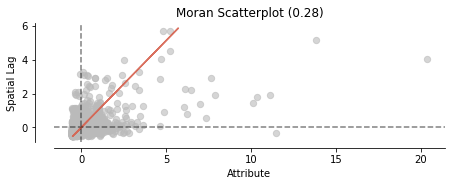

In [119]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

What does our Moran value of 0.28 mean? Essentially, how likely is our observed pattern on the map generated by an entirely random process? 
First, we need to compare our value with a simulation of 999 permutations that randomly shuffles the arrest data throughout the given geographies.

(<Figure size 504x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Reference Distribution'}, xlabel='Moran I: 0.28', ylabel='Density'>)

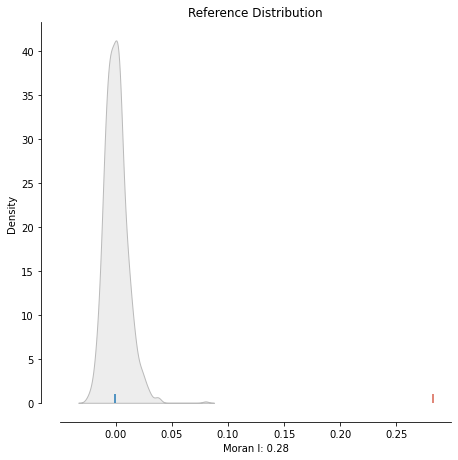

In [120]:
plot_moran_simulation(moran,aspect_equal=False)

In [121]:
moran.p_sim

0.001

Our p-value comes out to be 0.1%

Now, let's move on to our moran local values to obtain a moran local scatterplot!

In [122]:
lisa = esda.moran.Moran_Local(y, wq)

Time to plot it!

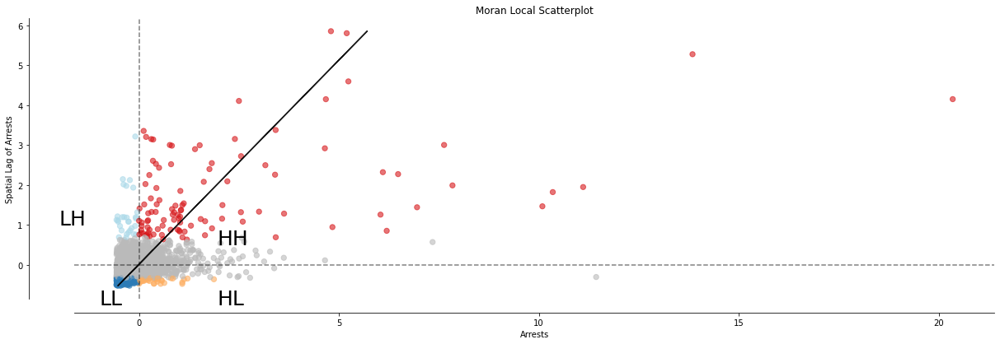

In [123]:
fig,ax = plt.subplots(figsize=(20,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Arrests")
ax.set_ylabel('Spatial Lag of Arrests')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

Interesting, okay the colored dots representcensus block groups that have a P-value less that 0.05 in each quadrant. Esentially, these are the statisticaly significantly, spatially autocorrelated locations.

FINALLY, our spatial autocorrelation map!!

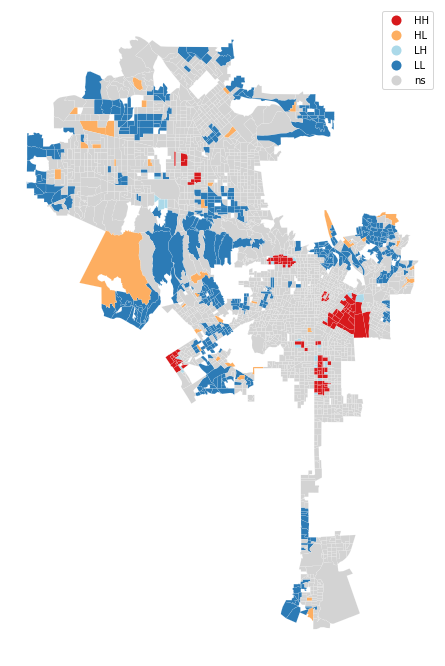

In [124]:
fig, ax = plt.subplots(figsize=(14,12))
lisa_cluster(lisa, gdf, p=0.05, ax=ax)
plt.show()

Thinking back to last year and the summer uprisings, this map makes a lot of sense as to where we see statistically significant clusters along Downtown LA, East LA, Venice, Hollywood, and South Central LA. 